In [1]:
import pandas as pd
import numpy as np
import os
import sys
import gc
from sklearn.manifold import TSNE
from importlib import reload
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn import linear_model
from sklearn.metrics import confusion_matrix
from sklearn import tree
from sklearn.ensemble import RandomForestRegressor
import scipy 

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

import utils
reload(utils)

<module 'utils' from '/Users/milk/Desktop/git_repositories/READMISSIONS/washtenaw_case_study/notebooks/utils.py'>

In [2]:
matplotlib.rcParams['figure.dpi'] = 200
plt.style.use('seaborn-deep')

# Cluster Analysis

In [3]:
%%time
data_df = pd.read_csv("../cleaned_data/clean_data.csv")
print(data_df.shape)

(5013, 5338)
CPU times: user 7.84 s, sys: 501 ms, total: 8.34 s
Wall time: 9.02 s


In [4]:
"""
Load column names
"""
tmp = pd.read_csv("../cleaned_data/population_column_map.csv")
POP_COLNAMES = dict(zip(tmp.GEO_ID, tmp.id))

tmp = pd.read_csv("../cleaned_data/income_column_map.csv")
INC_COLNAMES = dict(zip(tmp.GEO_ID, tmp.id))

tmp = pd.read_csv("../cleaned_data/occuptation_column_map.csv")
OCC_COLNAMES = dict(zip(tmp.GEO_ID, tmp.id))

tmp = pd.read_csv("../cleaned_data/education_column_map.csv")
EDU_COLNAMES = dict(zip(tmp.GEO_ID, tmp.id))

tmp = pd.read_csv("../cleaned_data/income_column_map.csv")
INC_COLNAMES = dict(zip(tmp.GEO_ID, tmp.id))

tmp = pd.read_csv("../cleaned_data/eigenvalue_column_map.csv")
REDS = tmp['Red_Columns'].to_list()
GREENS = tmp['Green_Columns'].to_list()
BLUES = tmp['Blue_Columns'].to_list()

tmp = pd.read_csv("../cleaned_data/google_column_map.csv")
GOOGLE_RED_COLS = [x for x in tmp['r_color_pixel_columns'] if str(x) != 'nan']
GOOGLE_GREEN_COLS = [x for x in tmp['g_color_pixel_columns'] if str(x) != 'nan']
GOOGLE_BLUE_COLS = [x for x in tmp['b_color_pixel_columns'] if str(x) != 'nan']
GOOGLE_COL_SCORE_COLS = [x for x in tmp['color_score_columns'] if str(x) != 'nan']
GOOGLE_COL_FRAC_COLS = [x for x in tmp['color_fraction_columns'] if str(x) != 'nan']
GOOGLE_LABEL_COLS = [x for x in tmp['Label_columns'] if str(x) != 'nan']
GOOGLE_LABEL_SCORE_COLS = [x for x in tmp['Label_score_columns'] if str(x) != 'nan']

MANUAL_LABELS = [x.strip() for x in open("../image_data/manual_labels.txt")]
print(f"Number of Distinct Labels in curated list: {len(MANUAL_LABELS)}")

Number of Distinct Labels in curated list: 99


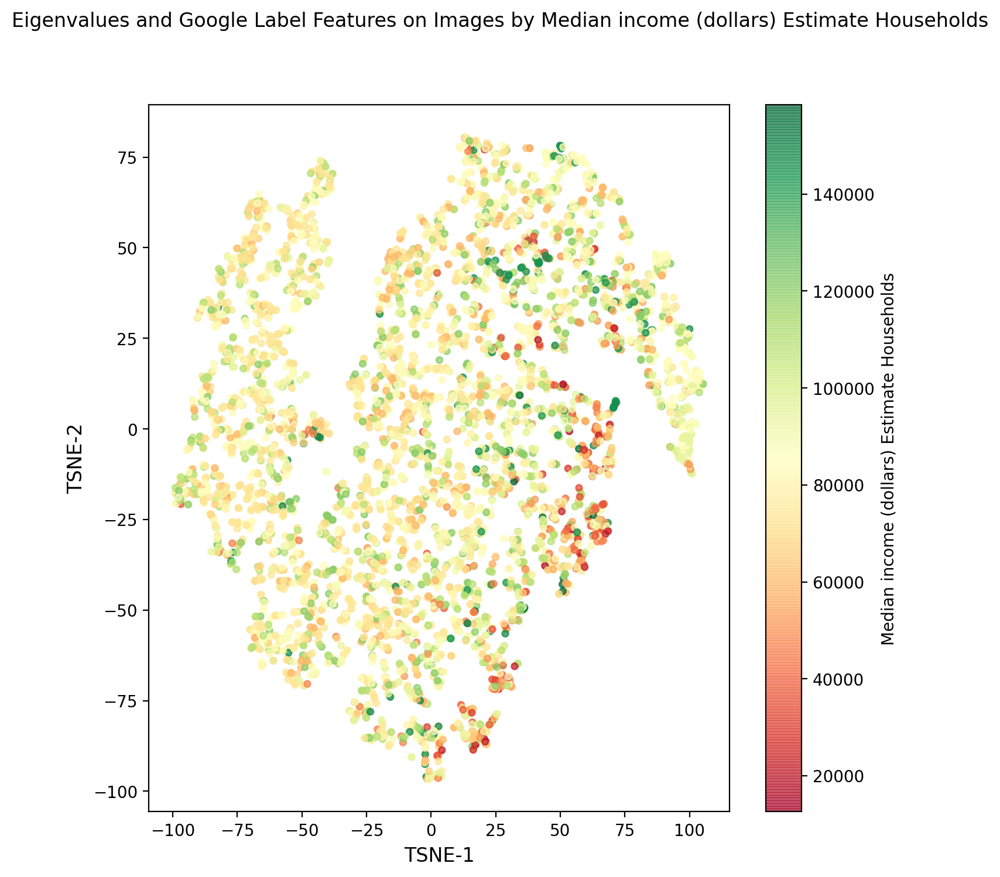

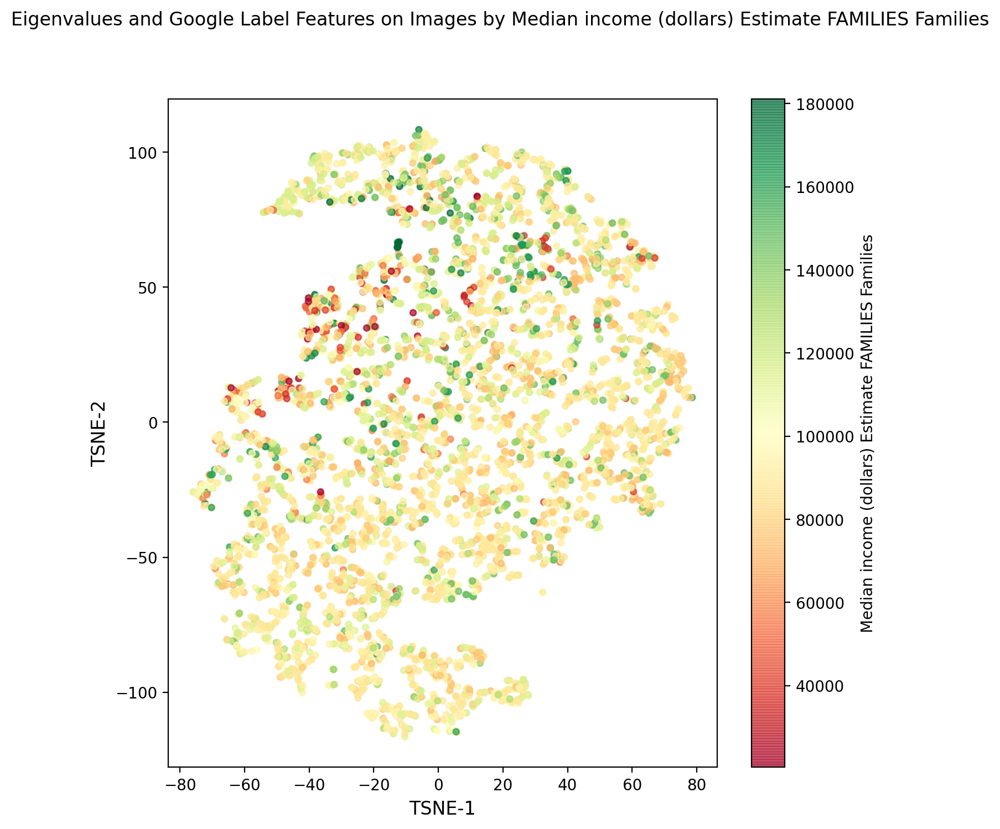

In [5]:
"""
Cluster images examining median income patterns
"""

for target in ['S1903_C02_001E', 'S1903_C02_015E']:
    TARGET_COL = target
    COL_TRANS = INC_COLNAMES[TARGET_COL].replace("!!", " ")
    TITLE = f'Eigenvalues and Google Label Features on Images by {COL_TRANS}'
    SAMPLE_SIZE =  len(data_df)
    FEATURES = MANUAL_LABELS + REDS + BLUES + GREENS
    PERPLEXITY = 13
    MISSING_VALUE_DICT = {
        '(X)':np.nan,
        '-':np.nan,
        '**':np.nan}

    sample = data_df.sample(SAMPLE_SIZE)
    sample[TARGET_COL] = sample[TARGET_COL].replace(MISSING_VALUE_DICT)
    sample = sample[sample[TARGET_COL].notna()]
    

    embedded = TSNE(n_components=2, 
                    perplexity=PERPLEXITY).fit_transform(sample[FEATURES])

    fig = utils.build_fig(title=f"{TITLE}",
                          size = (8, 8),
                          y_lab="TSNE-2", 
                          x_lab="TSNE-1")

    scat = plt.scatter(embedded[:, 0], 
                embedded[:, 1], 
                c=sample[TARGET_COL],
                s=15, 
                alpha=0.7,
                cmap='RdYlGn')

    cb = plt.colorbar(scat)
    cb.set_label(f'{COL_TRANS}')
    save_filepath = f"../figures/{TITLE}.png"
    plt.savefig(save_filepath,  bbox_inches = 'tight')

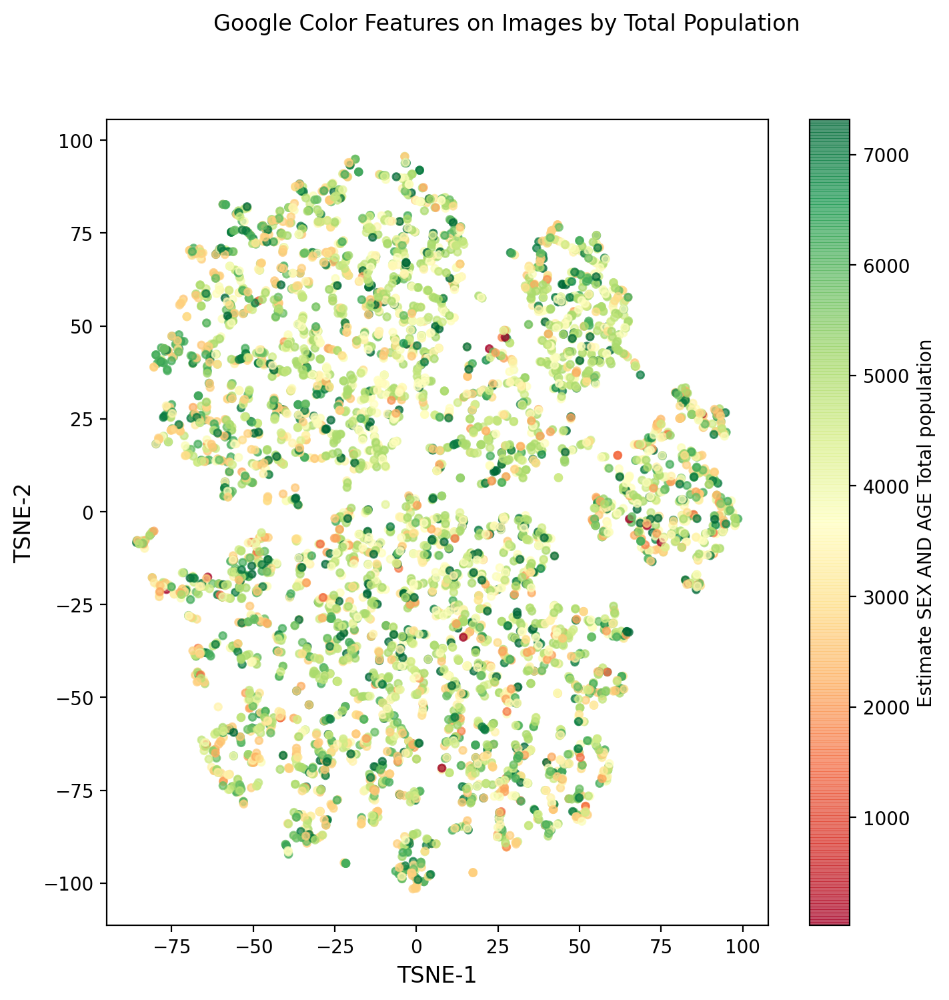

In [6]:
"""
Cluster images by color and population
"""

for target in ['DP05_0001E']:
    TARGET_COL = target
    COL_TRANS = POP_COLNAMES[TARGET_COL].replace("!!", " ")
    TITLE = f'Google Color Features on Images by Total Population'
    SAMPLE_SIZE = len(data_df)
    FEATURES = GOOGLE_BLUE_COLS + GOOGLE_GREEN_COLS + GOOGLE_RED_COLS + GOOGLE_COL_FRAC_COLS
    PERPLEXITY = 13

    sample = data_df.sample(SAMPLE_SIZE)
    sample[FEATURES] = sample[FEATURES].replace([np.inf, -np.inf], np.nan).fillna(0)

    embedded = TSNE(n_components=2, 
                    perplexity=PERPLEXITY).fit_transform(sample[FEATURES])

    fig = utils.build_fig(title=f"{TITLE}",
                          size = (8, 8),
                          y_lab="TSNE-2", 
                          x_lab="TSNE-1")

    scat = plt.scatter(embedded[:, 0], 
                embedded[:, 1], 
                c=sample[TARGET_COL],
                s=15, 
                alpha=0.7,
                cmap='RdYlGn')

    cb = plt.colorbar(scat)
    cb.set_label(f'{COL_TRANS}')
    save_filepath = f"../figures/{TITLE}.png"
    plt.savefig(save_filepath,  bbox_inches = 'tight')

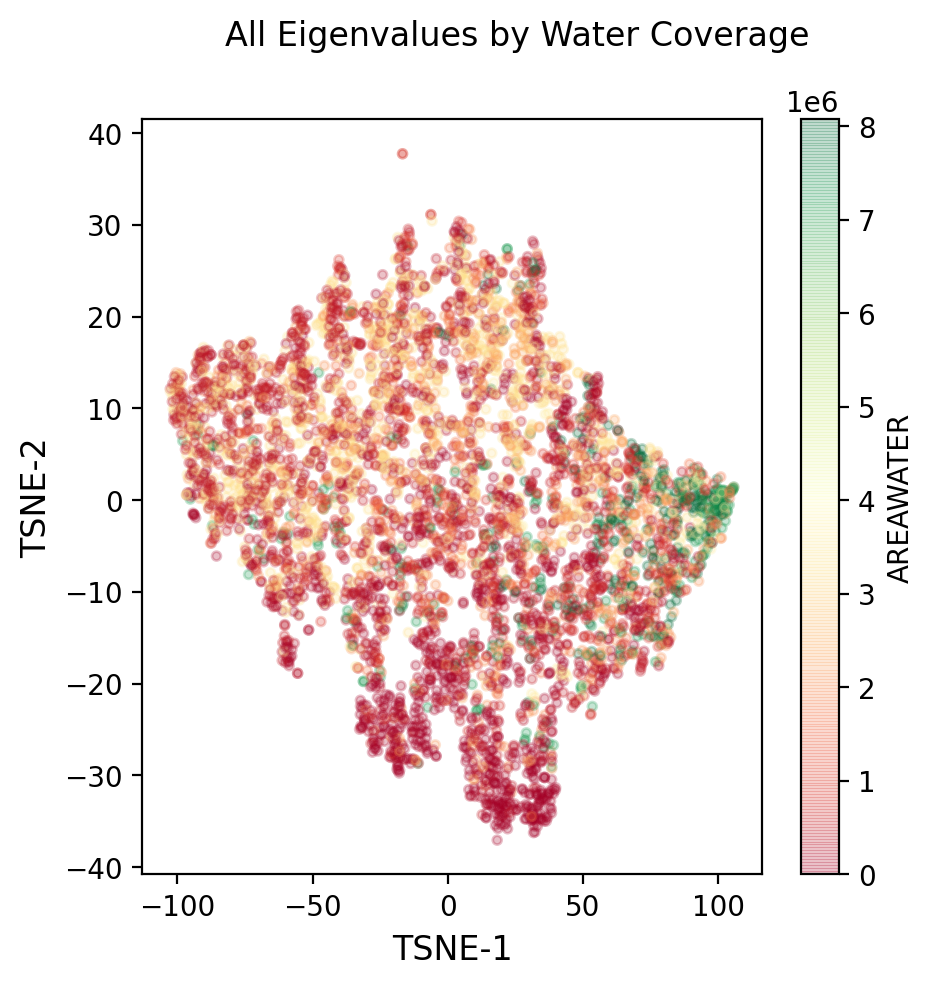

In [11]:
TITLE = 'All Eigenvalues by Water Coverage'
PERPLEXITY = 50

embedded = TSNE(n_components=2, 
                perplexity=PERPLEXITY).fit_transform(data_df[REDS + GREENS + BLUES])

fig = utils.build_fig(title=f"{TITLE}",
                      y_lab="TSNE-2", 
                      x_lab="TSNE-1")

scat = plt.scatter(embedded[:, 0], 
                   embedded[:, 1], 
                   s=10, 
                   c=data_df['AREAWATER'],
                   alpha=0.25,
                   cmap='RdYlGn')

cb = plt.colorbar(scat)
cb.set_label('AREAWATER')
save_filepath = f"../figures/{TITLE}.png"
plt.savefig(save_filepath,  bbox_inches = 'tight')

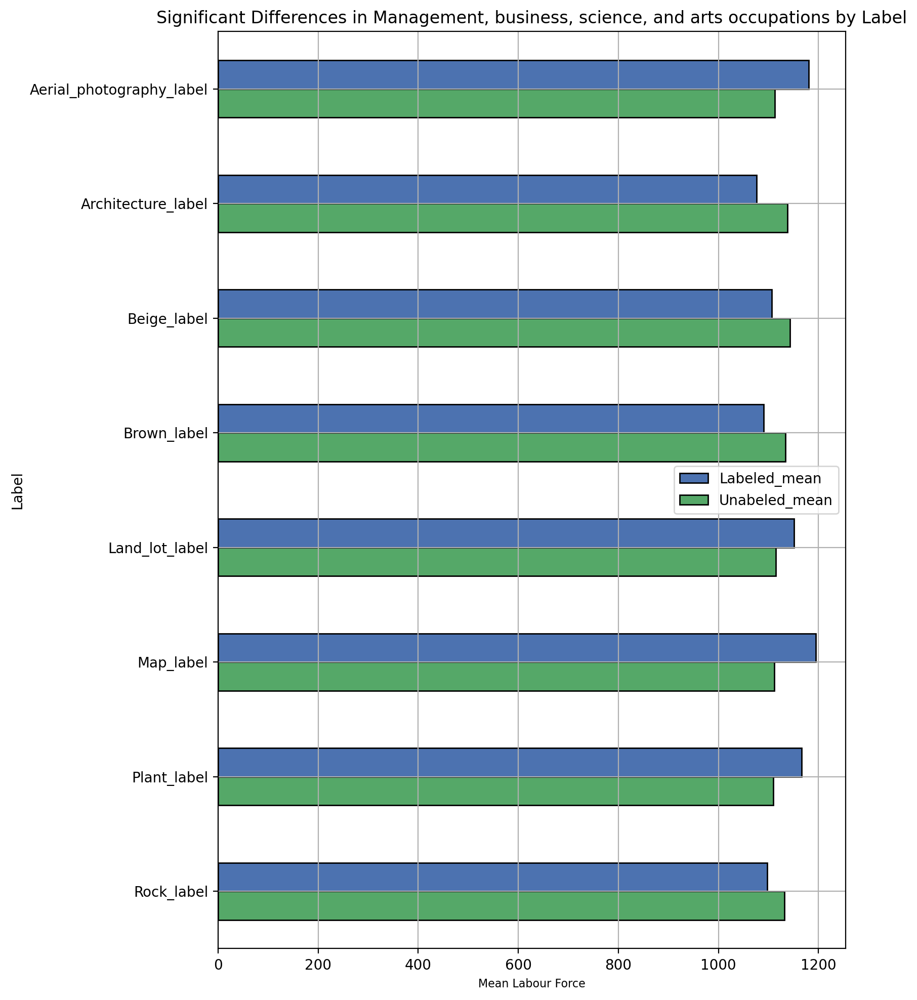

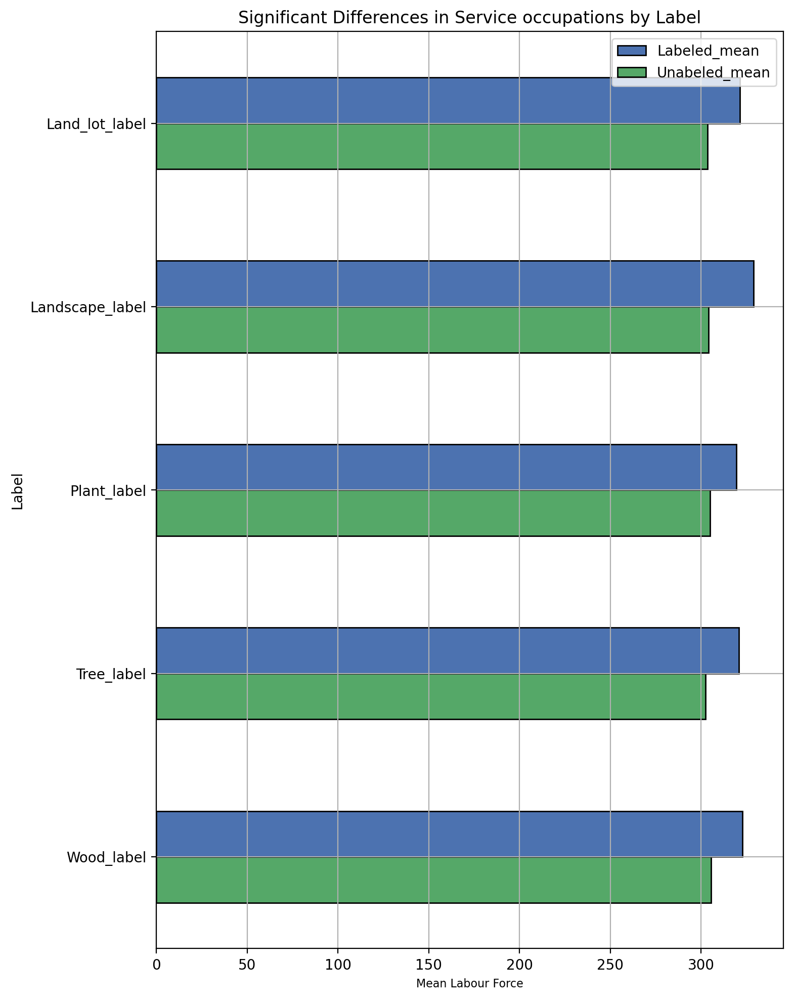

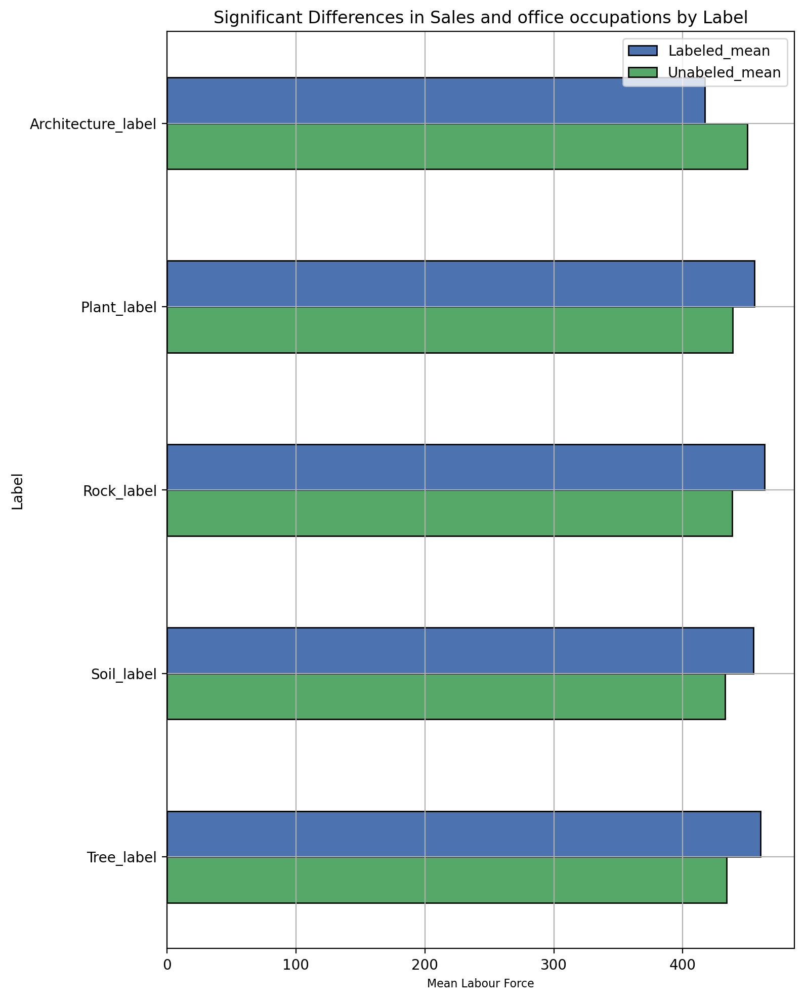

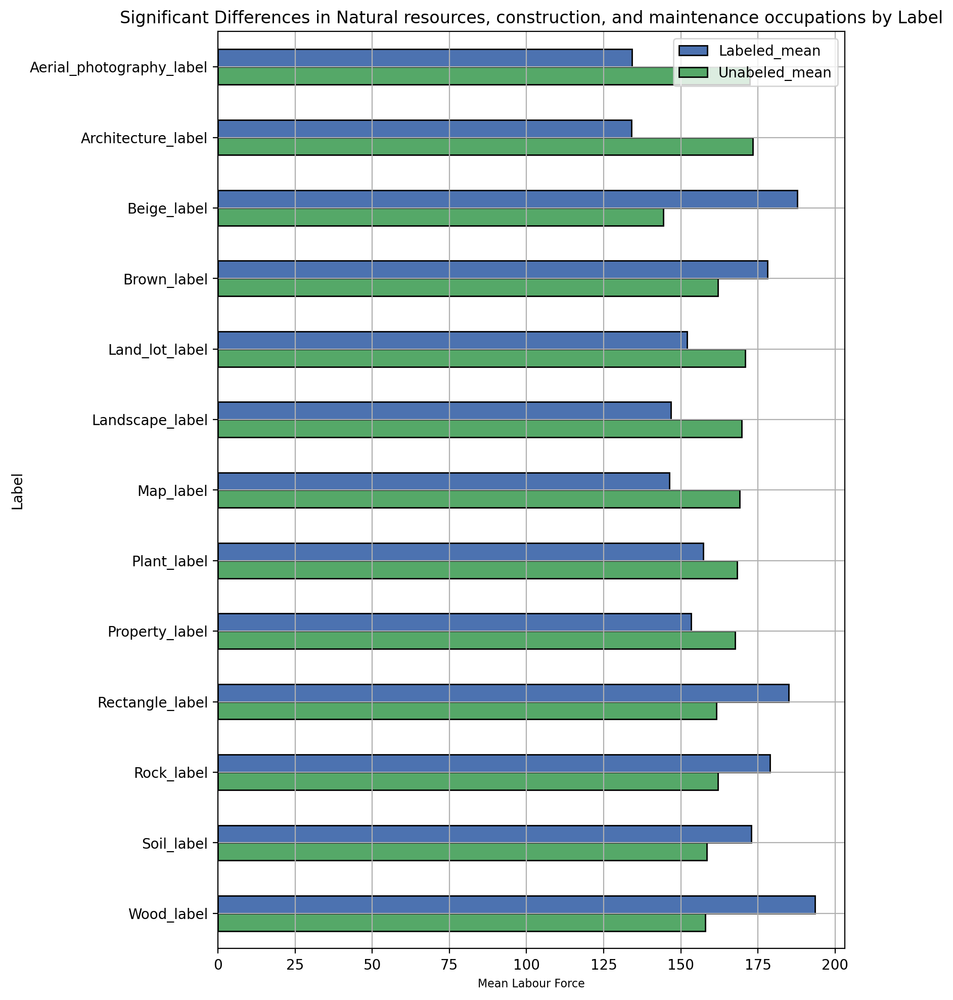

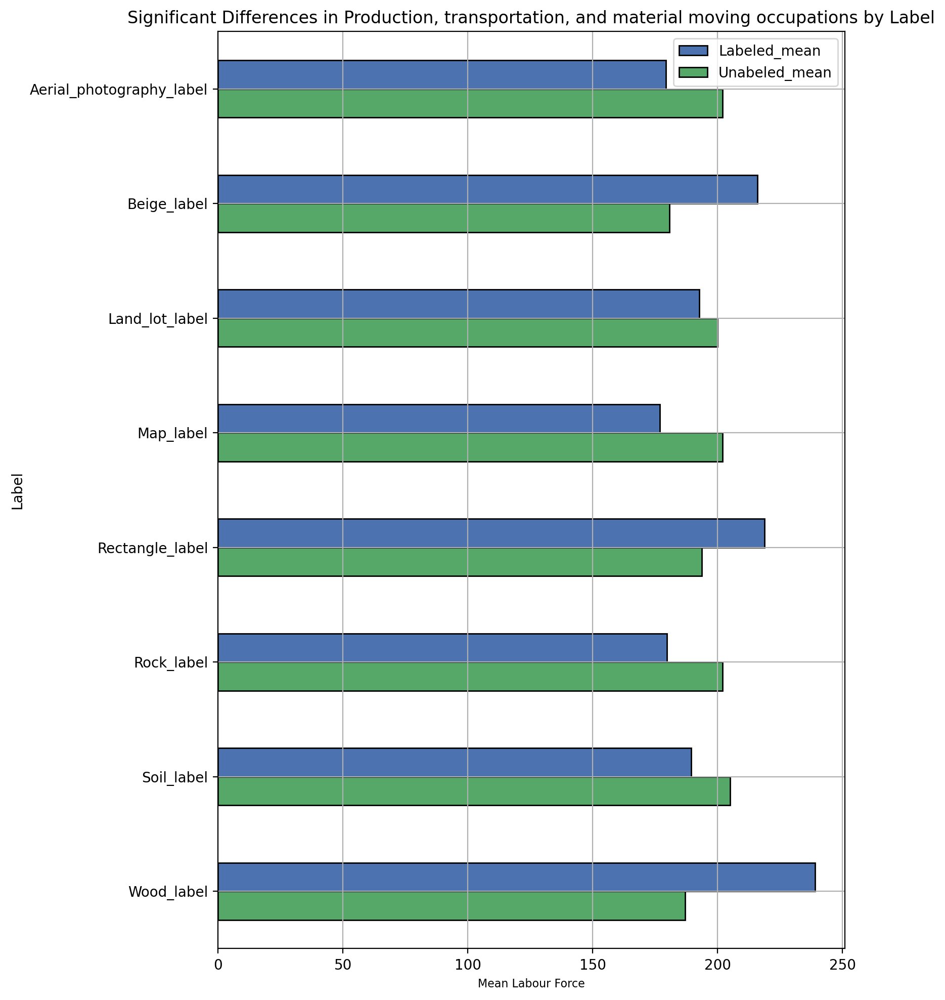

In [131]:
"""
How do primary occupation cartegories differ by label predictions?
"""

SAMPLE_SIZE = len(data_df)
MIN_LABEL_THRESHOLD = int(len(data_df) / 10)
NAN_POLICY = 'omit'

sample = data_df.sample(SAMPLE_SIZE)

# get occupation categories
occ_categories = {}
for k, v in OCC_COLNAMES.items():
    if 'Total!!Estimate!!' in v:
        if len(v.split('!!')) == 3 and not k == 'S2401_C01_001E':
            occ_categories[k] = v.split('!!')[2]

new_rows = []

for category in occ_categories.keys():
    for col in MANUAL_LABELS:

        labeled = sample[sample[col] == 1]
        unlabeled = sample[sample[col] == 0]

        if len(labeled) < MIN_LABEL_THRESHOLD:
            continue

        T, pval = scipy.stats.ttest_ind(labeled[category], 
                                        unlabeled[category], 
                                        nan_policy=NAN_POLICY)

        row = {
            'Labour_Category':occ_categories[category],
            'Label':col,
            'N_labeled':len(labeled),
            'N_unlabeled':len(unlabeled),
            'Labeled_mean':labeled[category].mean(),
            'Unabeled_mean':unlabeled[category].mean(),
            'T-Obs':T,
            'p-Value':pval,
            'Bonferroni_Alpha': 1 - (1 - 0.05)**0.5
        }

        new_rows.append(row)

res = pd.DataFrame(new_rows)
res['Reject'] = np.where(res['p-Value'] <= res['Bonferroni_Alpha'], 'True', 'False' )

for cat in occ_categories.values():
    TITLE = f'Significant Differences in {cat} by Label'
    sigs = res[(res['Labour_Category'] == cat) & (res['Reject'] == 'True')]
    sigs.set_index('Label', inplace=True)
    sigs = sigs[['Labeled_mean', 'Unabeled_mean']]
    sigs.plot(kind='barh', edgecolor='black', figsize=(8, 12), title=TITLE)
    plt.grid()
    plt.xlabel('Mean Labour Force', fontsize=8)
    plt.gca().invert_yaxis()
    save_filepath = f"../figures/{TITLE}.png"
    plt.savefig(save_filepath,  bbox_inches = 'tight')


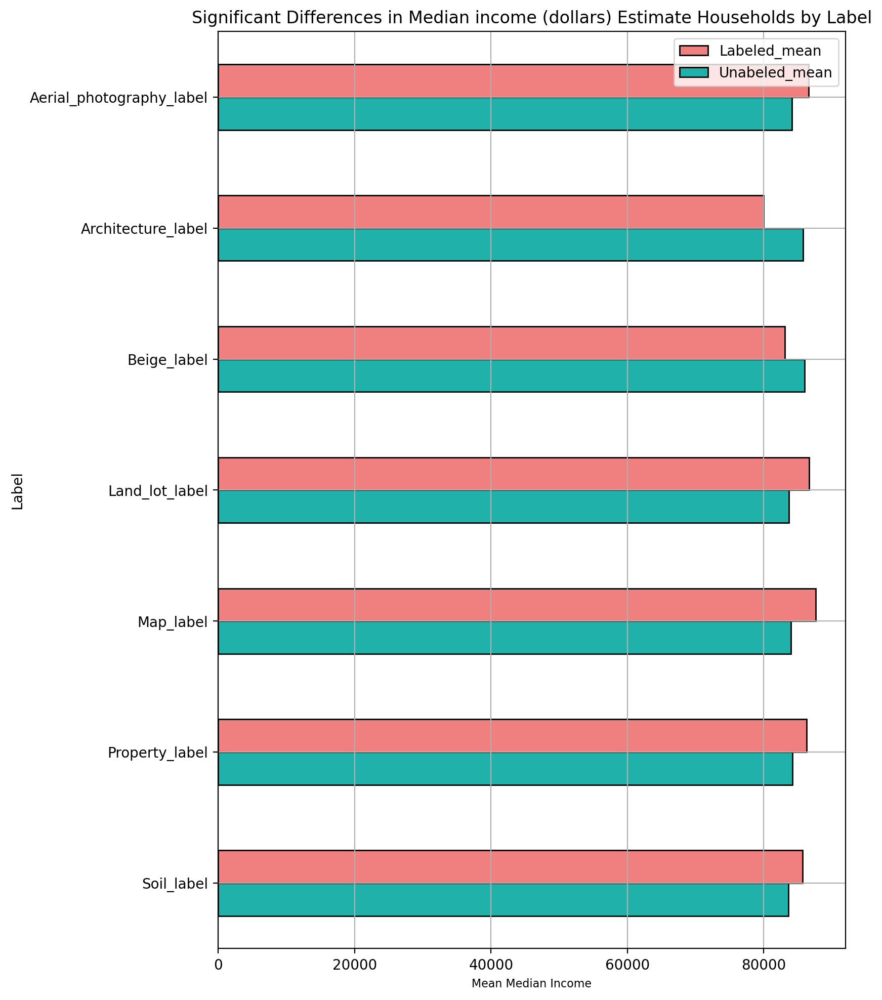

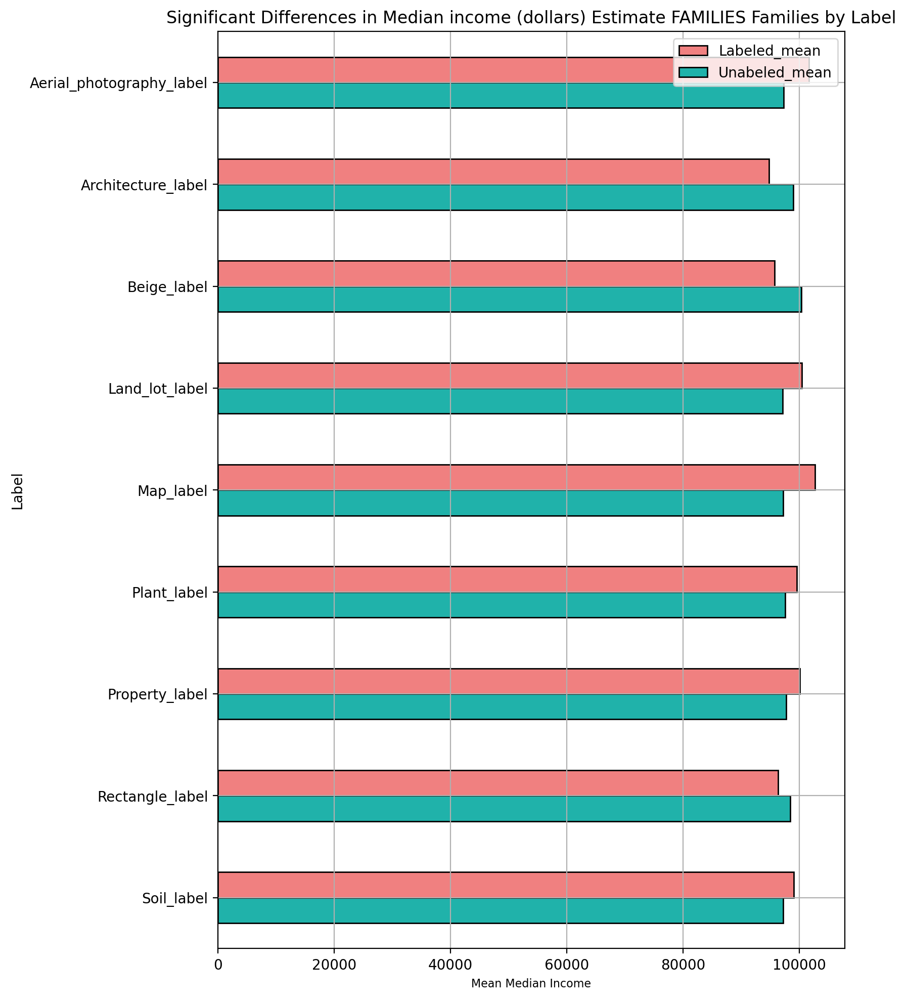

In [132]:
"""
How does median income differ by label predictions?
"""

SAMPLE_SIZE = len(data_df)
MIN_LABEL_THRESHOLD = int(len(data_df) / 10)
NAN_POLICY = 'omit'
MISSING = {
    '-': np.nan,
    '-': np.nan,
    '+':np.nan,
    '***': np.nan,
    '*****': np.nan,
    'N': np.nan,
    '(X)':np.nan
}

sample = data_df.sample(SAMPLE_SIZE)

new_rows = []

for category in ['S1903_C02_001E', 'S1903_C02_015E']:
    for col in MANUAL_LABELS:

        labeled = sample[sample[col] == 1]
        unlabeled = sample[sample[col] == 0]

        if len(labeled) < MIN_LABEL_THRESHOLD:
            continue

        lab = labeled[category].replace(MISSING).astype(float)
        unlab = unlabeled[category].replace(MISSING).astype(float)

        T, pval = scipy.stats.ttest_ind(lab, unlab, 
                                        nan_policy=NAN_POLICY)

        row = {
            'Income_Category':INC_COLNAMES[category],
            'Label':col,
            'N_labeled':len(labeled),
            'N_unlabeled':len(unlabeled),
            'Labeled_mean':np.mean(lab),
            'Unabeled_mean':np.mean(unlab),
            'T-Obs':T,
            'p-Value':pval,
            'Bonferroni_Alpha': 1 - (1 - 0.05)**0.5
        }

        new_rows.append(row)

res = pd.DataFrame(new_rows)
res.head()

res['Reject'] = np.where(res['p-Value'] <= res['Bonferroni_Alpha'], 'True', 'False' )

for x in ['S1903_C02_001E', 'S1903_C02_015E']:
    cat = INC_COLNAMES[x]
    clean_cat = cat.replace("!!", " ")
    TITLE = f'Significant Differences in {clean_cat} by Label'
    sigs = res[(res['Income_Category'] == cat) & (res['Reject'] == 'True')]
    sigs.set_index('Label', inplace=True)
    sigs = sigs[['Labeled_mean', 'Unabeled_mean']]
    sigs.plot(kind='barh', edgecolor='black', color=['lightcoral','lightseagreen'], figsize=(8, 12), title=TITLE)
    plt.grid()
    plt.xlabel('Mean Median Income', fontsize=8)
    plt.gca().invert_yaxis()
    save_filepath = f"../figures/{TITLE}.png"
    plt.savefig(save_filepath,  bbox_inches = 'tight')


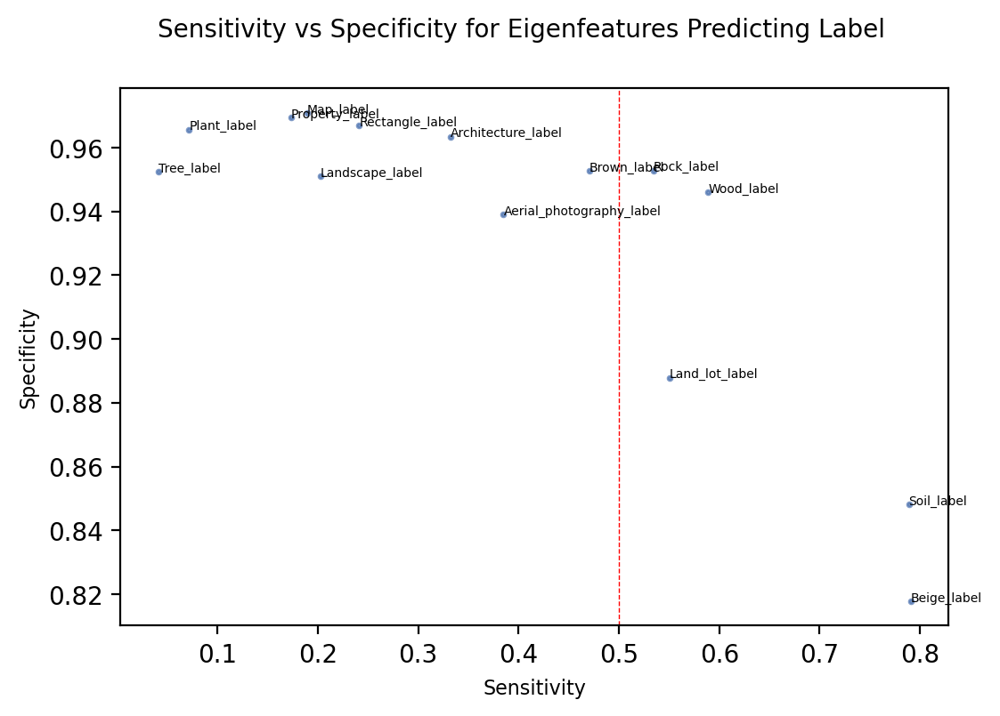

In [133]:
"""
how to the eigenvalues relate to the labels? We use just the eigenvalues to predict the google labels
"""
SAMPLE_SIZE = len(data_df)
MIN_LABEL_THRESHOLD = int(len(data_df) / 10)
FEATURES = REDS + BLUES + GREENS

sample = data_df.sample(SAMPLE_SIZE)
new_rows = []

for idx, target in enumerate(MANUAL_LABELS):
    if sample[target].sum() >= MIN_LABEL_THRESHOLD:

        subset = sample[sample[target].notnull()]
        subset = subset.fillna(-999999)

        X_train, X_test, y_train, y_test = train_test_split(subset[FEATURES],
                                                            subset[target], 
                                                            test_size=0.33, 
                                                            stratify=subset[target])

        clf = linear_model.LogisticRegression()
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        total = np.sum([tn, fp, fn, tp ])
        auc = roc_auc_score(y_test, y_pred)

        row = {
            'Target':target,
            'AUCROC':auc,
            'True_Positive': tp/total,
            'False_Positive': fp/total,
            'True_Negative': tn/total,
            'False_Negative': fn/total,
            'Sensitivity': tp / (tp + fn),
            'Specificity': tn / (tn + fp),
            'Sample_Size': SAMPLE_SIZE
        }

        new_rows.append(row)
res = pd.DataFrame(new_rows)
res.head()

TITLE = "Sensitivity vs Specificity for Eigenfeatures Predicting Label"

fig, ax = plt.subplots()
ax.scatter(res['Sensitivity'],  
           res['Specificity'], 
           s=3, 
           alpha=0.7)

for i, txt in enumerate(res['Target']):
    ax.annotate(txt, (res['Sensitivity'][i], res['Specificity'][i]), fontsize=5)

plt.axvline(0.5, color='r', ls='--', lw=0.5)
fig.suptitle(TITLE, fontsize=10)
plt.xlabel('Sensitivity', fontsize=8)
plt.ylabel('Specificity', fontsize=8)
save_filepath = f"../figures/{TITLE}.png"
plt.savefig(save_filepath,  bbox_inches = 'tight')

In [236]:
dir(utils)

['__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 'build_fig',
 'matplotlib',
 'np',
 'pd',
 'plt',
 'rand_jitter']

# Population Regression

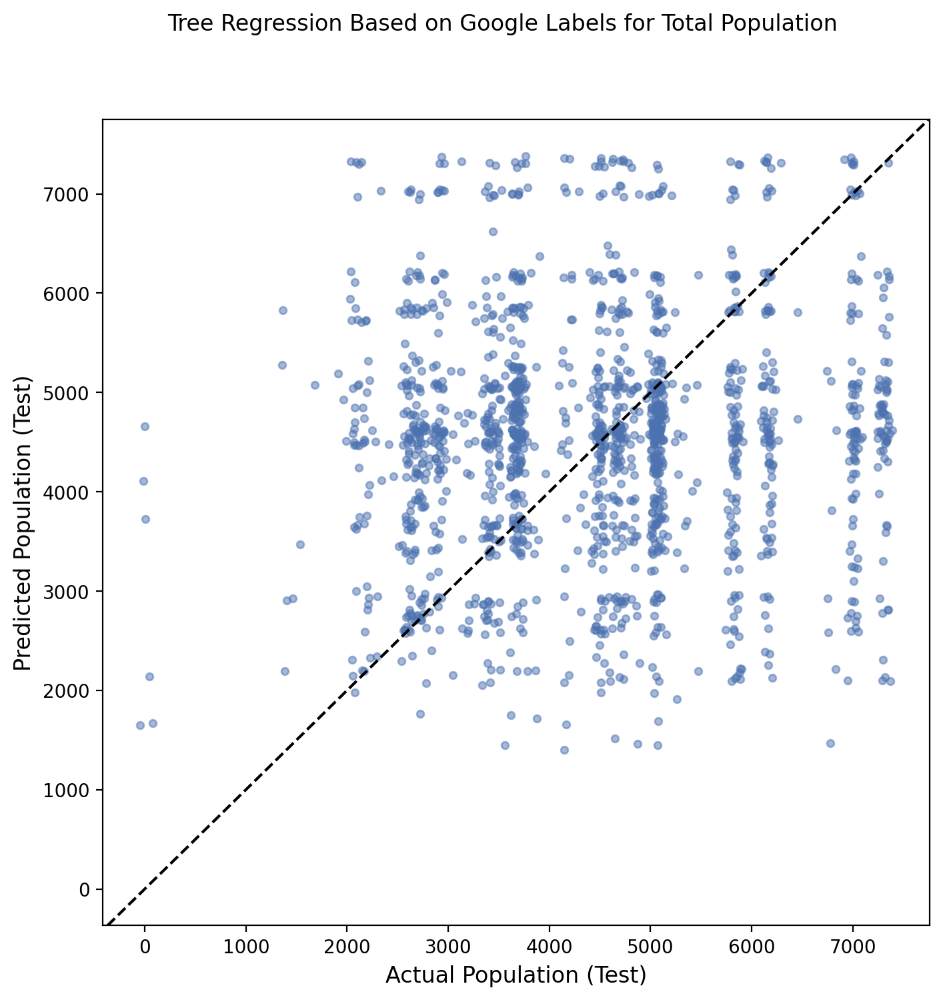

In [260]:
"""
Can we predict population using the manual labels?
"""

TITLE = f"Tree Regression Based on Google Labels for Total Population"
SAMPLE_SIZE = len(data_df)
FEATURES = MANUAL_LABELS
TARGET = 'DP05_0001E'

sample = data_df.sample(SAMPLE_SIZE)

X_train, X_test, y_train, y_test = train_test_split(sample[FEATURES],
                                                    sample[TARGET], 
                                                    test_size=0.33)

clf = tree.DecisionTreeRegressor(criterion='mse')
# clf = RandomForestRegressor(max_depth=10, criterion='mae')
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)


fig = utils.build_fig(title=f"{TITLE}",
                        size = (8, 8),
                        y_lab="Predicted Population (Test)", 
                        x_lab="Actual Population (Test)")

scat = plt.scatter(utils.rand_jitter(y_test, 0.005), utils.rand_jitter(y_pred, 0.005),
            s=15, 
            alpha=0.5)


plt.axline([0, 0], [1, 1], c='black', ls="--")
save_filepath = f"../figures/{TITLE}.png"
plt.savefig(save_filepath,  bbox_inches = 'tight')

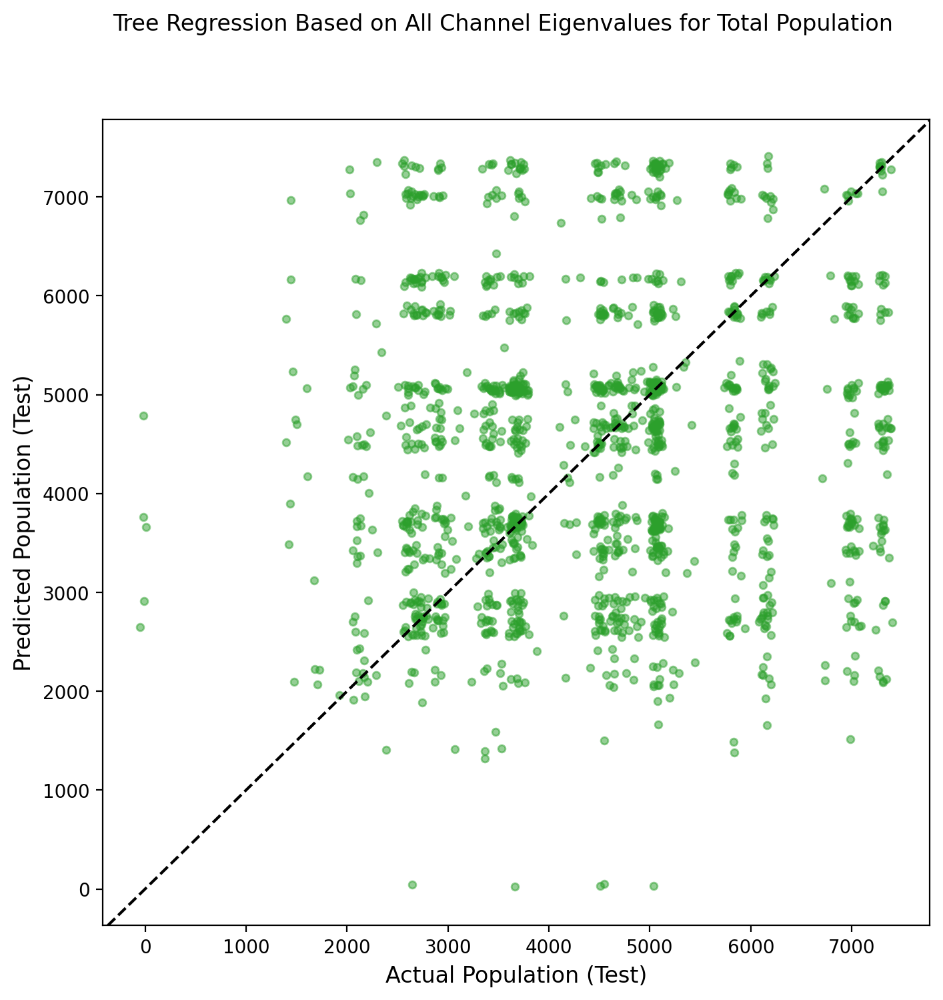

In [264]:
"""
Can we predict population using the manual labels?
"""

TITLE = f"Tree Regression Based on All Channel Eigenvalues for Total Population"
SAMPLE_SIZE = len(data_df)
FEATURES = REDS + BLUES + GREENS
TARGET = 'DP05_0001E'

sample = data_df.sample(SAMPLE_SIZE)

X_train, X_test, y_train, y_test = train_test_split(sample[FEATURES],
                                                    sample[TARGET], 
                                                    test_size=0.33)

clf = tree.DecisionTreeRegressor(criterion='mse')
# clf = RandomForestRegressor(max_depth=10, criterion='mse')
# clf = linear_model.LinearRegression()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

fig = utils.build_fig(title=f"{TITLE}",
                        size = (8, 8),
                        y_lab="Predicted Population (Test)", 
                        x_lab="Actual Population (Test)")

scat = plt.scatter(utils.rand_jitter(y_test, 0.005), utils.rand_jitter(y_pred, 0.005),
            s=15, 
            alpha=0.5,
            c='tab:green')


plt.axline([0, 0], [1, 1], c='black', ls="--")
save_filepath = f"../figures/{TITLE}.png"
plt.savefig(save_filepath,  bbox_inches = 'tight')

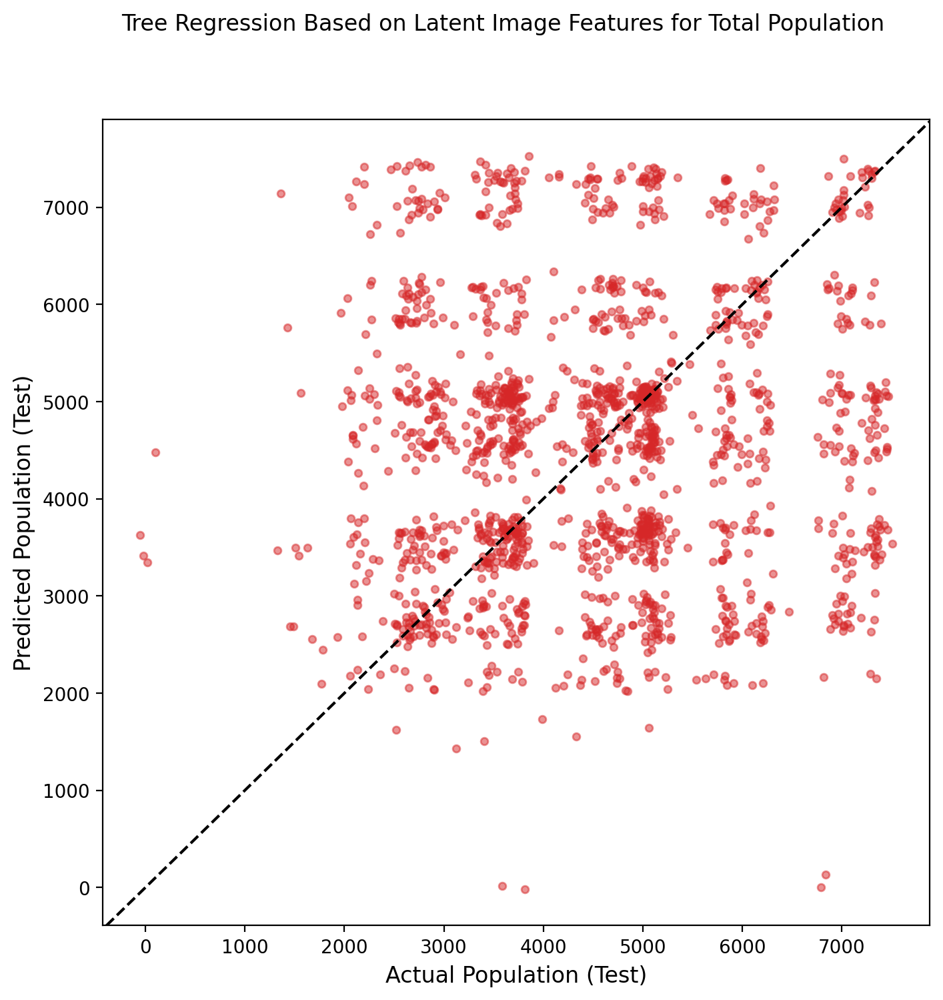

In [271]:
"""
Can we predict population using the manual labels?
"""

TITLE = f"Tree Regression Based on Latent Image Features for Total Population"
SAMPLE_SIZE = len(data_df)
FEATURES = REDS + BLUES + GREENS + GOOGLE_LABEL_COLS + GOOGLE_BLUE_COLS + GOOGLE_GREEN_COLS + GOOGLE_RED_COLS
TARGET = 'DP05_0001E'

sample = data_df.sample(SAMPLE_SIZE)
sample[FEATURES] = sample[FEATURES].replace([np.inf, -np.inf], np.nan).fillna(0)

X_train, X_test, y_train, y_test = train_test_split(sample[FEATURES],
                                                    sample[TARGET], 
                                                    test_size=0.33)

clf = tree.DecisionTreeRegressor(criterion='mse')
# clf = RandomForestRegressor(max_depth=3, criterion='mse')
# clf = linear_model.LinearRegression()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)

fig = utils.build_fig(title=f"{TITLE}",
                        size = (8, 8),
                        y_lab="Predicted Population (Test)", 
                        x_lab="Actual Population (Test)")

scat = plt.scatter(utils.rand_jitter(y_test, 0.01), utils.rand_jitter(y_pred, 0.01),
            s=15, 
            alpha=0.5,
            c='tab:red')

plt.axline([0, 0], [1, 1], c='black', ls="--")
save_filepath = f"../figures/{TITLE}.png"
plt.savefig(save_filepath,  bbox_inches = 'tight')

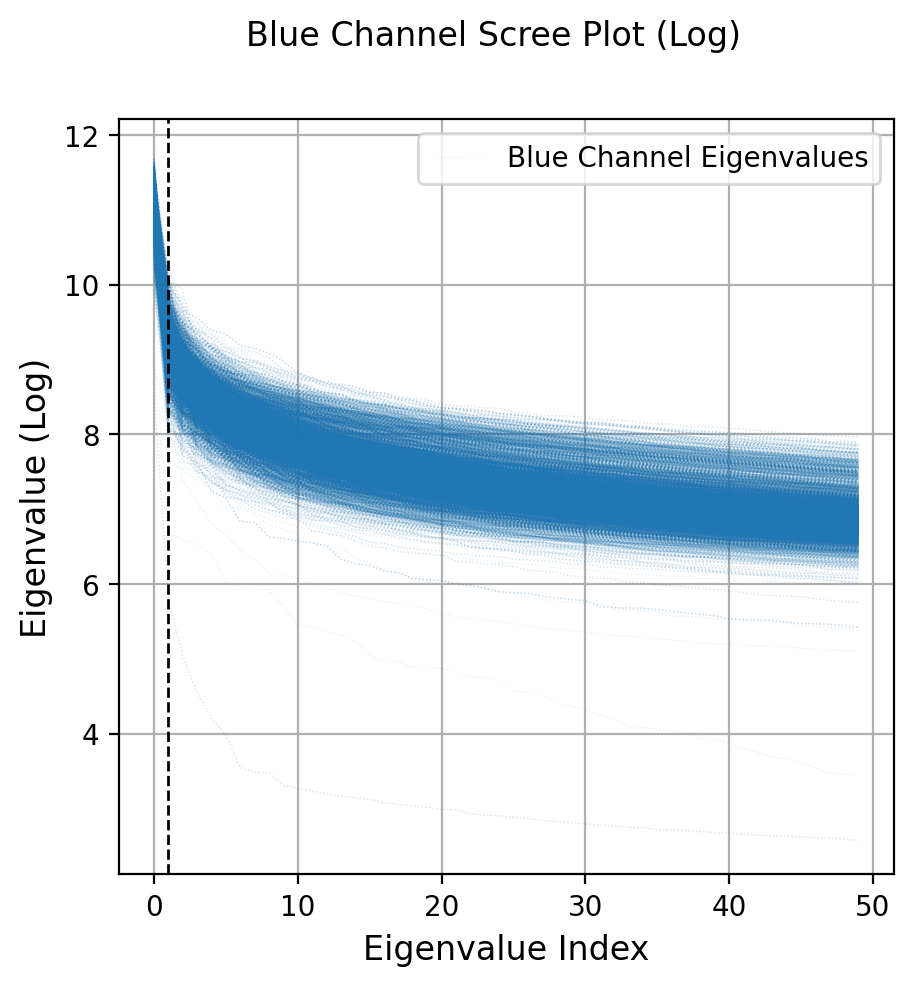

In [284]:

CHANNEL = "Blue"
TITLE = f'{CHANNEL} Channel Scree Plot (Log)'
SAMPLE_SIZE = len(data_df)
FIRST_N = 50
LINE_ALPHA = 0.1
LINE_WIDTH = 0.5

col_dict = {
    'Blue': 'tab:blue',
    'Red': 'tab:red',
    'Green': 'tab:green'
}

chan_dict = {
    'Blue': BLUES,
    'Red': REDS,
    'Green': GREENS
}

sample = data_df.sample(SAMPLE_SIZE)

ind = np.array(range(len(chan_dict[CHANNEL])))[:FIRST_N]

fig = utils.build_fig(title=f"{TITLE}",
                      y_lab="Eigenvalue (Log)", 
                      x_lab="Eigenvalue Index")

for i in range(SAMPLE_SIZE):
    vals = sample[chan_dict[CHANNEL]].sample(1).values.ravel()[:FIRST_N]

    if i == 0:
        plt.plot(ind, 
                 np.log(vals), 
                 c=col_dict[CHANNEL], 
                 ls=":", 
                 alpha=LINE_ALPHA,
                 linewidth=LINE_WIDTH, 
                 label=f'{CHANNEL} Channel Eigenvalues')
        plt.legend()
        plt.grid()
    else:
        plt.plot(ind, 
                 np.log(vals), 
                 c=col_dict[CHANNEL], 
                 ls=":", 
                 alpha=LINE_ALPHA,
                 linewidth=LINE_WIDTH)

plt.axvline(1, color='black', ls='--', lw=1)
save_filepath = f"../figures/{TITLE}.png"
plt.savefig(save_filepath,  bbox_inches = 'tight')